<a href="https://colab.research.google.com/github/niccolozanotti/ipcv-assignments/blob/assignment-1/book_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module #1

---

## Approach Overview

This solution implements a **traditional computer vision pipeline** for detecting books on shelves.

### Key Design Decisions

After extensive experimentation, we adopted a **simplified pipeline** based on the following observations about our dataset:

1. **Books are nearly planar**: Shelf images have minimal perspective distortion
2. **Books are upright or horizontal**: Spines can be vertical or horizontal (stacked shelves)
3. **Scale is consistent**: Model and scene images have similar scale
4. **Multiple copies are adjacent**: Same book appears side-by-side on shelves

These characteristics led us to choose:

| Component | Choice | Justification |
|-----------|--------|---------------|
| Features | RootSIFT | ~15-30% better matching than standard SIFT |
| Preprocessing | Clahe + Histogram Equalization | We don't use it in the final version to preserv contrast and small details (images are not to noisy) |
| Matching | BF 5NN consecutive ratio test | Captures good matches at any rank position, fondamental to detect multiple instances in the same scene |
| Geometric model | **Similarity transform** (4 DOF) | Uniform scale + rotation + translation; strongest inductive bias for books |
| Multi-instance | Iterative detection with keypoint index exclusion | Handles multiple copies efficiently |

### Why Similarity Transform (4 DOF) Instead of Full Affine (6 DOF) or Homography (8 DOF)?

| Property | Homography | Full Affine | Similarity (Partial Affine) |
|----------|------------|-------------|----------------------------|
| Degrees of freedom | 8 | 6 | **4** |
| Minimum points | 4 | 3 | **2** |
| Handles perspective | Yes | No | No |
| Preserves aspect ratio | No | No | **Yes** |
| Allows shear | Yes | Yes | **No** |
| Stability with few points | Lowest | Medium | **Highest** |

Books on shelves do not undergo perspective distortion, shear, or non-uniform scaling. The similarity transform (`cv2.estimateAffinePartial2D`) encodes exactly this **inductive bias**: it only allows uniform scaling, rotation, and translation. This makes RANSAC converge faster and more reliably, especially with the limited matches (~8-15) typical of narrow book spines.

The resulting 2×3 matrix is converted to a 3×3 homography matrix (by appending `[0, 0, 1]`) for convenient corner projection via `cv2.perspectiveTransform`.

## 1. Setup and Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from typing import List, Tuple, Optional, Set
from dataclasses import dataclass
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

print(f"OpenCV version: {cv2.__version__}")

OpenCV version: 4.13.0


## 2. Configuration

All parameters are centralized here with justifications.

In [2]:
class Config:
    """
    Configuration parameters for the detection pipeline.

    Each parameter is justified based on dataset characteristics
    and experimental results.
    """

    # === FEATURE DETECTION ===
    # SIFT parameters (used via RootSIFT)
    SIFT_FEATURES = 0                # 0 = detect all features
    SIFT_N_OCTAVE_LAYERS = 7         # Increased from default value to capture more details
    SIFT_CONTRAST_THRESHOLD = 0.02   # Lowered form default value to detect more keypoints
    SIFT_EDGE_THRESHOLD = 10         # Default value
    SIFT_SIGMA = 1.2                 # Slightly lower than default 1.6 to detect more keypoints

    # === PREPROCESSING ===
    # Clahe + histogram equalization
    CLAHE_CLIP_LIMIT = 2.0   # Moderate contrast enhancement
    CLAHE_GRID_SIZE = (4, 4) # 4x4 provides finer local adaptation than 8x8
    apply_PREPROCESSING = False # Not applying preprocessing

    # === FEATURE MATCHING ===
    # BF 5NN consecutive ratio test:
    KNN_K = 5                        # Number of nearest neighbors considerd
    KNN_CONSECUTIVE_RATIO = 0.6      # Consecutive neighbor ratio threshold

    # === GEOMETRIC VERIFICATION ===
    # Similarity transformation (4 DOF) with RANSAC
    MIN_MATCH_COUNT = 3                  # Minimum matches to attempt estimation
    RANSAC_REPROJ_THRESHOLD = 4.0        # Pixels — allows small localization errors

    # === DETECTION VALIDATION ===
    MIN_INLIERS = 3                  # Minimum inliers for valid detection
    MIN_INLIERS_RATIO = 1 / 3        # At least 1/3 of matches should be inliers
    MIN_AREA = 1000                  # Minimum bounding box area (pixels)
    MAX_AREA = 100000                # Maximum bounding box area (pixels)
    MIN_EXTENT = 0.5                  # Min ratio: contour area / bounding rect area
    LOW_EXTENT_THRESHOLD = 0.65          # Below this extent, require extra inlier support
    MIN_INLIERS_LOW_EXTENT = 5           # Minimum inliers when extent is below LOW_EXTENT_THRESHOLD
    TOLERANCE_on_IMAGE_LIMITS = 4    # Tolerance in pixels of the bounding box to exeed the frame.
                                     # Fondamental for the detection of model_14 in scene_4, a correct
                                     # detection had a bounding box out of the frame by 3 pixels.

    # === MULTI-INSTANCE DETECTION ===
    MAX_INSTANCES_PER_BOOK = 10      # Safety limit
    SAME_BOOK_IOU_THRESHOLD = 0.30    # Reject same-book detection if >30% overlap with previous instance

## 3. Data Classes

Structured representation of detection results.

In [3]:
@dataclass
class BoundingBox:
    """
    Represents a detected book instance.

    Stores the four corners of the bounding quadrilateral,
    which may not be axis-aligned due to the affine transformation.
    """
    top_left: Tuple[int, int]
    top_right: Tuple[int, int]
    bottom_right: Tuple[int, int]
    bottom_left: Tuple[int, int]
    area: int
    n_inliers: int
    inlier_ratio: float

    def get_polygon(self) -> np.ndarray:
        """Return corners as numpy array for geometric operations."""
        return np.array([self.top_left, self.top_right,
                        self.bottom_right, self.bottom_left], dtype=np.float32)

@dataclass
class BookDetection:
    """All detections for a single book model in a scene."""
    book_id: int
    model_path: str
    instances: List[BoundingBox]

## 4. RootSIFT Feature Extractor

### Why RootSIFT?

Standard SIFT descriptors are compared using Euclidean distance. However, SIFT descriptors are histograms of gradient orientations, and the **Hellinger kernel** (Bhattacharyya distance) is more appropriate for histogram comparison.

RootSIFT achieves this by:
1. L1-normalizing the SIFT descriptor
2. Taking the element-wise square root

This allows Euclidean distance to implicitly compute Hellinger distance, providing **~15-30% better matching accuracy**.

**Reference**: Arandjelović & Zisserman, "Three things everyone should know to improve object retrieval" (CVPR 2012)

In [4]:
class RootSIFT:
    """
    RootSIFT feature extractor.

    Enhances SIFT descriptors for better matching performance
    by applying L1 normalization followed by square root.
    """

    def __init__(self):
        self.sift = cv2.SIFT_create(
            nfeatures=Config.SIFT_FEATURES,
            nOctaveLayers=Config.SIFT_N_OCTAVE_LAYERS,
            contrastThreshold=Config.SIFT_CONTRAST_THRESHOLD,
            edgeThreshold=Config.SIFT_EDGE_THRESHOLD,
            sigma=Config.SIFT_SIGMA
        )

    def detect_and_compute(self, image: np.ndarray):
        """
        Detect keypoints and compute RootSIFT descriptors.

        Args:
            image: Grayscale input image

        Returns:
            keypoints: List of cv2.KeyPoint
            descriptors: RootSIFT descriptors (Nx128 float32 array)
        """
        keypoints, descriptors = self.sift.detectAndCompute(image, None)

        if descriptors is None or len(descriptors) == 0:
            return keypoints, None

        # Convert to RootSIFT
        eps = 1e-7

        # Step 1: L1 normalize
        descriptors = descriptors / (np.sum(descriptors, axis=1, keepdims=True) + eps)

        # Step 2: Square root (Hellinger kernel)
        descriptors = np.sqrt(descriptors)

        return keypoints, descriptors.astype(np.float32)

## 5. Image Preprocessing

### Why Gaussian Blur + Histogram Equalization?

Shelf images have varying lighting conditions and noise. We apply:

1. **Gaussian Blur** (`13×13` kernel): Smooths high-frequency noise before feature extraction, helping SIFT focus on meaningful structures rather than texture noise.
2. **Histogram Equalization**: Normalizes global contrast, making features more consistent across images with different lighting conditions.

This combination provides effective preprocessing while remaining simple and deterministic.

In [5]:
class ImagePreprocessor:
    """
    Preprocessing pipeline: Gaussian smoothing + histogram equalization.
    """

    def preprocess(self, image: np.ndarray) -> np.ndarray:
        """
        Convert to grayscale, apply Gaussian blur, and equalize histogram.

        Args:
            image: BGR input image

        Returns:
            Preprocessed grayscale image
        """
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
        if Config.apply_PREPROCESSING:
            blurred = self.clahe.apply(gray)
            return cv2.equalizeHist(blurred)
        else:
            return gray

## 6. Feature Matching

### BF 5NN Consecutive Ratio Test

For each model keypoint's 5 nearest neighbors we compare consecutive distances: keep `match[i]` if                                       
`match[i].distance < 0.6 * match[i+1].distance`.

Unlike the standard Lowe's ratio test that only checks rank 1 vs rank 2, this captures good matches at **any rank position**. This is particularly valuable for multi-instance detection, where a model keypoint may match multiple scene locations at different ranks.
We decided to use a 5NN knowing there are not more than 4 instances of the same book in a single scene of the dataset used. Could be increased from the class Config for robustness and generalization.

In [6]:
class FeatureMatcher:
    """
    Feature matcher using BF 5NN consecutive ratio test.

    For each model keypoint, finds 5 nearest neighbors in the scene
    and keeps match[i] if match[i].distance < ratio * match[i+1].distance.
    """

    def __init__(self):
        self.bf = cv2.BFMatcher(cv2.NORM_L2)

    def match(self, des_model: np.ndarray, des_scene: np.ndarray,
              excluded_indices: Set[int] = None) -> List[cv2.DMatch]:
        """
        Match model descriptors to scene descriptors.

        Args:
            des_model: Model descriptors
            des_scene: Scene descriptors
            excluded_indices: Scene keypoint indices to exclude (already matched)

        Returns:
            List of good matches
        """
        if des_model is None or des_scene is None:
            return []
        if len(des_model) < 2 or len(des_scene) < Config.KNN_K:
            return []

        if excluded_indices is None:
            excluded_indices = set()

        try:
            knn_matches = self.bf.knnMatch(des_model, des_scene, k=Config.KNN_K)
        except cv2.error:
            return []

        good_matches = []
        seen = set()

        for match_group in knn_matches:
            for i in range(len(match_group) - 1):
                m = match_group[i]
                m_next = match_group[i + 1]

                if m.trainIdx in excluded_indices:
                    continue

                if m.distance < Config.KNN_CONSECUTIVE_RATIO * m_next.distance:
                    key = (m.queryIdx, m.trainIdx)
                    if key not in seen:
                        seen.add(key)
                        good_matches.append(m)

        return good_matches

## 7. Geometry Utilities

Helper functions for geometric validation.

In [7]:
class GeometryUtils:
    """Geometric utility functions."""

    @staticmethod
    def polygon_area(points: np.ndarray) -> float:
        """Compute polygon area using Shoelace formula."""
        n = len(points)
        area = 0.0
        for i in range(n):
            j = (i + 1) % n
            area += points[i][0] * points[j][1]
            area -= points[j][0] * points[i][1]
        return abs(area) / 2.0

    @staticmethod
    def polygon_iou(poly1: np.ndarray, poly2: np.ndarray) -> float:
        """Compute Intersection over Union for two polygons."""
        all_pts = np.vstack([poly1, poly2])
        x_min = max(0, int(np.floor(all_pts[:, 0].min())) - 5)
        y_min = max(0, int(np.floor(all_pts[:, 1].min())) - 5)
        x_max = int(np.ceil(all_pts[:, 0].max())) + 5
        y_max = int(np.ceil(all_pts[:, 1].max())) + 5

        w, h = x_max - x_min, y_max - y_min
        if w <= 0 or h <= 0:
            return 0.0

        offset = np.array([x_min, y_min])
        mask1 = np.zeros((h, w), dtype=np.uint8)
        mask2 = np.zeros((h, w), dtype=np.uint8)
        cv2.fillPoly(mask1, [(poly1 - offset).astype(np.int32)], 1)
        cv2.fillPoly(mask2, [(poly2 - offset).astype(np.int32)], 1)

        intersection = np.sum(mask1 & mask2)
        union = np.sum(mask1 | mask2)
        return intersection / union if union > 0 else 0.0


## 8. Similarity Transform Estimator

### Why Similarity Transform (Partial Affine) Instead of Full Affine or Homography?

We use `cv2.estimateAffinePartial2D` which estimates a **similarity transform** (4 DOF):

$$
\begin{bmatrix}
x' \\
y'
\end{bmatrix}
=
\begin{bmatrix}
s \cos\theta & -s \sin\theta \\
s \sin\theta & s \cos\theta
\end{bmatrix}
\begin{bmatrix}
x \\
y
\end{bmatrix}
+
\begin{bmatrix}
t_x \\
t_y
\end{bmatrix}
$$

This allows only:
- **Uniform scaling** (single scale factor $s$)
- **Rotation** (angle $\\theta$)
- **Translation** ($t_x$, $t_y$)

### Why This Is Better for Books

- **Books preserve aspect ratio**: A book spine is always the same width-to-height ratio
- **No shear in shelf images**: Books sit upright or lie flat, without trapezoidal distortion
- **Fewer parameters = more robust**: With only 4 unknowns (vs 6 for full affine, 8 for homography), RANSAC converges faster

In [8]:
class AffineEstimator:
    """
    Similarity transform estimator using RANSAC.
    """

    def estimate(self, src_pts: np.ndarray, dst_pts: np.ndarray) -> Tuple[Optional[np.ndarray], Optional[np.ndarray], int]:
        """
        Estimate similarity transformation using RANSAC.

        Args:
            src_pts: Source points (model) - Nx2 array
            dst_pts: Destination points (scene) - Nx2 array

        Returns:
            (homography_matrix, inlier_mask, n_inliers)
            homography_matrix is 3x3 (similarity embedded in homography form)
        """
        if len(src_pts) < 2:
            return None, None, 0

        try:
            M, inliers = cv2.estimateAffinePartial2D(
                src_pts.reshape(-1, 1, 2),
                dst_pts.reshape(-1, 1, 2),
                method=cv2.RANSAC,
                ransacReprojThreshold=Config.RANSAC_REPROJ_THRESHOLD,
            )

            if M is None or inliers is None:
                return None, None, 0

            # Convert 2x3 affine to 3x3 homography matrix
            H = np.vstack([M, [0, 0, 1]])

            n_inliers = int(np.sum(inliers))
            return H, inliers, n_inliers

        except cv2.error:
            return None, None, 0

    def transform_corners(self, H: np.ndarray, model_shape: Tuple[int, int]) -> np.ndarray:
        """
        Project model corners to scene using the homography matrix.

        Args:
            H: 3x3 homography matrix
            model_shape: (height, width) of model image

        Returns:
            Projected corners as 4x2 array: [TL, TR, BR, BL]
        """
        h, w = model_shape
        corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
        projected = cv2.perspectiveTransform(corners, H)
        return projected.reshape(-1, 2)

## 9. Detection Validation

### Validation Criteria

A detected rectangle is considered valid if:
1. **4 points**: The projected contour has exactly 4 corners
2. **Reasonable area**: Between 1000 and 100000 pixels
3. **Roughly rectangular**: The ratio of contour area to bounding rect area (extent) is above 0.5
4. **Within image bounds**: All corners lie within the image dimensions with a tolerance of 4 pixels

In [9]:
def is_rectangle_valid(rectangle: np.ndarray, image_shape: Tuple[int, ...]) -> Tuple[bool, str]:
    """
    Validate whether a detected rectangle is geometrically reasonable.

    Criteria:
    1. Should have 4 points
    2. Area should be within a reasonable range
    3. Shape should be roughly rectangular (extent check)
    4. Rectangle should be within the image bounds

    Args:
        rectangle: 4x1x2 or 4x2 array of corner points
        image_shape: (height, width, ...) of the scene image

    Returns:
        (is_valid, reason_string)
    """
    # Ensure correct shape for cv2 functions
    rect = np.int32(rectangle)
    if rect.ndim == 2:
        rect = rect.reshape(-1, 1, 2)

    if len(rect) != 4:
        return False, "Not 4 points"

    # Check area
    area = cv2.contourArea(rect)
    if area < Config.MIN_AREA or area > Config.MAX_AREA:
        return False, f"Invalid area: {area:.0f}"

    # Check ratio of contour area to bounding box area (extent)
    x, y, w, h = cv2.boundingRect(rect)
    bounding_box_area = w * h
    if bounding_box_area == 0:
        return False, "Zero bounding box area"
    extent = area / bounding_box_area

    if extent < Config.MIN_EXTENT:
        return False, f"Not rectangular enough: extent={extent:.2f}"

    # Check if the rectangle is within the image bounds
    for p in rect:
        px, py = p[0]
        if px + Config.TOLERANCE_on_IMAGE_LIMITS < 0  or px - Config.TOLERANCE_on_IMAGE_LIMITS >= image_shape[1] or py + Config.TOLERANCE_on_IMAGE_LIMITS < 0 or py - Config.TOLERANCE_on_IMAGE_LIMITS >= image_shape[0]:
            return False, "Point out of bounds"

    return True, "Valid rectangle"

### Combined Extent + Inlier Check

The **extent** of a detection is the ratio of its contour area to its axis-aligned bounding box area. A perfectly rectangular detection has extent ≈ 1.0; a skewed one has lower extent because rotation inflates the bounding box.

A simple `MIN_EXTENT` threshold creates a dilemma:

| Case | Extent | Inliers | Verdict |
|------|--------|---------|--------|
| Scene 4, Book 15 iter 2 (false positive) | 0.620 | 3 | Should reject |
| Scene 16, Book 12 iter 2 (true positive) | 0.601 | 10 (100%) | Should accept |

Both have similar extent, so no single threshold can separate them. However, the key difference is **inlier support**: the false positive has only 3 inliers (the minimum), while the true positive has 10 with 100% inlier ratio — strong geometric consensus.

The solution is a **combined check**: detections with low extent (below `LOW_EXTENT_THRESHOLD = 0.65`) are only accepted if they have sufficient inlier support (`MIN_INLIERS_LOW_EXTENT = 5`). This rejects poorly-supported skewed detections while preserving well-supported ones that happen to be slightly rotated.


## 10. Book Detector

### Multi-Instance Detection: Iterative Keypoint Exclusion

1. Match all model keypoints to scene (excluding previously used indices)
2. Estimate similarity transformation (RANSAC)
3. Validate the detection (number of inlier, inlier ratio, rectangle validity)
4. If valid: save detection, add inlier scene keypoint indices to exclusion set
5. Re-match with excluded indices, repeat until no valid detections remain

This approach extracts features only once and allows multiple RANSAC
attempts even when match quality degrades.

In [10]:
class BookDetector:
    """
    Main book detection pipeline.

    Pipeline:
    1. Preprocess images (Gaussian blur + histogram equalization)
    2. Extract RootSIFT features
    3. Match features (BF 5NN consecutive ratio test)
    4. Iterative detection with keypoint index exclusion
    """

    def __init__(self):
        self.preprocessor = ImagePreprocessor()
        self.feature_extractor = RootSIFT()
        self.matcher = FeatureMatcher()
        self.affine_estimator = AffineEstimator()
        self.model_cache = {}

    def load_model(self, model_path: str):
        """Load and cache model image features."""
        if model_path in self.model_cache:
            return self.model_cache[model_path]

        img = cv2.imread(model_path)
        if img is None:
            raise ValueError(f"Could not load: {model_path}")

        gray = self.preprocessor.preprocess(img)
        kp, des = self.feature_extractor.detect_and_compute(gray)

        self.model_cache[model_path] = (img, kp, des)
        return img, kp, des

    def detect_in_scene(self, scene_path: str, model_paths: List[str],
                        verbose: bool = False) -> Tuple[List[BookDetection], np.ndarray]:
        """
        Detect all books in a scene image.
        """
        scene_img = cv2.imread(scene_path)
        if scene_img is None:
            raise ValueError(f"Could not load: {scene_path}")

        scene_gray = self.preprocessor.preprocess(scene_img)
        scene_kp, scene_des = self.feature_extractor.detect_and_compute(scene_gray)

        if verbose:
            print(f"Scene: {Path(scene_path).name} - {len(scene_kp)} keypoints")

        detections = []
        result_img = scene_img.copy()

        for book_id, model_path in enumerate(model_paths):
            model_img, model_kp, model_des = self.load_model(model_path)

            if model_des is None or len(model_kp) < Config.MIN_MATCH_COUNT:
                detections.append(BookDetection(book_id, model_path, []))
                continue

            instances = self._detect_instances(
                model_img, model_kp, model_des,
                scene_img, scene_kp, scene_des,
            )

            detection = BookDetection(book_id, model_path, instances)
            detections.append(detection)
            self._draw_detection(result_img, detection)

            if verbose and len(instances) > 0:
                print(f"  Book {book_id}: {len(instances)} instance(s)")

        return detections, result_img


    def _detect_instances(self, model_img, model_kp, model_des,
                          scene_img, scene_kp, scene_des) -> List[BoundingBox]:
        """
        Detect all instances using iterative similarity estimation
        with keypoint index exclusion.

        Key improvement: spatial inlier filtering. After detecting an instance,
        only exclude inliers whose scene keypoint falls INSIDE the detected
        bounding box. This prevents RANSAC from "stealing" keypoints that
        physically belong to adjacent copies of the same book.
        """
        instances = []
        excluded_indices: Set[int] = set()

        for iteration in range(Config.MAX_INSTANCES_PER_BOOK):

            matches = self.matcher.match(model_des, scene_des, excluded_indices)

            if len(matches) < Config.MIN_MATCH_COUNT:
                break

            src_pts = np.float32([model_kp[m.queryIdx].pt for m in matches])
            dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in matches])
            match_indices = [m.trainIdx for m in matches]

            # Estimate similarity transformation
            H, inlier_mask, n_inliers = self.affine_estimator.estimate(src_pts, dst_pts)

            if H is None:
                break

            # Check inlier quality
            inlier_ratio = n_inliers / len(matches)
            if n_inliers < Config.MIN_INLIERS or inlier_ratio < Config.MIN_INLIERS_RATIO:
                break

            # Project model corners to scene
            projected = self.affine_estimator.transform_corners(H, model_img.shape[:2])

            is_valid, reason = is_rectangle_valid(projected, scene_img.shape)
            if not is_valid:
                break

            # Combined extent + inlier check: low-extent detections need
            # stronger inlier support to be trusted
            rect_check = np.int32(projected).reshape(-1, 1, 2)
            contour_area = cv2.contourArea(rect_check)
            x_r, y_r, w_r, h_r = cv2.boundingRect(rect_check)
            bb_area = w_r * h_r
            extent = contour_area / bb_area if bb_area > 0 else 0
            if extent < Config.LOW_EXTENT_THRESHOLD and n_inliers < Config.MIN_INLIERS_LOW_EXTENT:
                break

            # Compute area
            area = GeometryUtils.polygon_area(projected)

            bbox = BoundingBox(
                top_left=tuple(map(int, projected[0])),
                top_right=tuple(map(int, projected[1])),
                bottom_right=tuple(map(int, projected[2])),
                bottom_left=tuple(map(int, projected[3])),
                area=int(area),
                n_inliers=n_inliers,
                inlier_ratio=inlier_ratio
            )

            # Same-book overlap check: reject if >30% IoU with any
            # previously detected instance of this same book
            new_poly = bbox.get_polygon()
            is_same_book_dup = any(
                GeometryUtils.polygon_iou(new_poly, prev.get_polygon()) > Config.SAME_BOOK_IOU_THRESHOLD
                for prev in instances
            )
            if is_same_book_dup:
                # Exclude inliers so iteration can continue past this region
                polygon = projected.astype(np.float32).reshape(-1, 1, 2)
                for i in range(len(match_indices)):
                    if inlier_mask[i]:
                        kp_idx = match_indices[i]
                        pt = scene_kp[kp_idx].pt
                        if cv2.pointPolygonTest(polygon, pt, measureDist=True) >= 0:
                            excluded_indices.add(kp_idx)
                continue

            instances.append(bbox)

            # --- Spatial inlier filtering ---
            # Only exclude inliers whose scene keypoint falls INSIDE
            # the detected bounding box. This prevents RANSAC from claiming
            # keypoints that physically sit on adjacent book copies.
            polygon = projected.astype(np.float32).reshape(-1, 1, 2)
            for i in range(len(match_indices)):
                if inlier_mask[i]:
                    kp_idx = match_indices[i]
                    pt = scene_kp[kp_idx].pt
                    # pointPolygonTest returns positive if inside, 0 on edge, negative if outside
                    # Check to exclude only the inliers belonging to the instance just detected
                    if cv2.pointPolygonTest(polygon, pt, measureDist=True) >= 0:
                        excluded_indices.add(kp_idx)

        return instances

    def _draw_detection(self, img: np.ndarray, detection: BookDetection):
        """Draw bounding boxes on image."""
        colors = [
            (0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0),
            (255, 0, 255), (0, 255, 255), (128, 0, 255), (255, 128, 0)
        ]
        color = colors[detection.book_id % len(colors)]

        for inst in detection.instances:
            pts = np.array([inst.top_left, inst.top_right,
                           inst.bottom_right, inst.bottom_left], dtype=np.int32)
            cv2.polylines(img, [pts], True, color, 3)

            label = f"Book {detection.book_id}"
            pos = (inst.top_left[0], max(inst.top_left[1] - 10, 20))
            cv2.putText(img, label, pos, cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

## 11. Output Formatting

In [11]:
def format_output(detections: List[BookDetection]) -> str:
    """
    Format detection results as specified in the assignment.

    Output format:
    Book X - N instance(s) found:
      Instance 1 {top_left: (x,y), top_right: (x,y), ...}
    """
    lines = []

    for det in detections:
        if len(det.instances) > 0:
            lines.append(f"Book {det.book_id} - {len(det.instances)} instance(s) found:")

            for i, inst in enumerate(det.instances, 1):
                lines.append(
                    f"  Instance {i} {{"
                    f"top_left: {inst.top_left}, "
                    f"top_right: {inst.top_right}, "
                    f"bottom_left: {inst.bottom_left}, "
                    f"bottom_right: {inst.bottom_right}, "
                    f"area: {inst.area}px}}"
                )

    return "\n".join(lines)

## 12. Load Dataset

In [12]:
import urllib.request
import zipfile
import os
import shutil

# --- Configuration ---
COMMIT_HASH = "a455e8a87eb21bd2c649a20eb22e3273b025d185"

repo_zip_url = f"https://github.com/niccolozanotti/ipcv-assignments/archive/{COMMIT_HASH}.zip"
zip_path = "temp_repo.zip"
extract_dir = f"ipcv-assignments-{COMMIT_HASH}"

# 1. Download the specific commit zip
print(f"Downloading repository at commit {COMMIT_HASH[:7]}...")
urllib.request.urlretrieve(repo_zip_url, zip_path)

# 2. Extract ONLY the dataset folder
print("Extracting dataset folder...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for file in zip_ref.namelist():
        if file.startswith(f"{extract_dir}/dataset/"):
            zip_ref.extract(file, path=".")

# 3. Move the dataset folder to the current directory and clean up
if os.path.exists("dataset"):
    shutil.rmtree("dataset")

shutil.move(f"{extract_dir}/dataset", "dataset")
shutil.rmtree(extract_dir)
os.remove(zip_path)

print("Dataset successfully downloaded and ready to use!")

from pathlib import Path

MODELS_PATH = "dataset/models"
SCENES_PATH = "dataset/scenes"

model_files = sorted(Path(MODELS_PATH).glob("model_*.png"), key=lambda x: int(x.stem.split('_')[1]))
scene_files = sorted(Path(SCENES_PATH).glob("scene_*.jpg"), key=lambda x: int(x.stem.split('_')[1]))

model_paths = [str(f) for f in model_files]
scene_paths = [str(f) for f in scene_files]

print(f"Found {len(model_paths)} models and {len(scene_paths)} scenes")

Extracting dataset folder...
Dataset successfully downloaded and ready to use!
Found 22 models and 29 scenes


## 13. Run Full Detection

In [13]:
# Initialize detector
detector = BookDetector()

# Process all scenes
all_results = {}
all_images = {}

for idx, scene_path in enumerate(scene_paths):
    print(f"\nProcessing scene {idx}: {Path(scene_path).name}")

    detections, result_img = detector.detect_in_scene(scene_path, model_paths, verbose=False)

    all_results[idx] = detections
    all_images[idx] = result_img

    total = sum(len(d.instances) for d in detections)
    books = sum(1 for d in detections if len(d.instances) > 0)
    print(f"  Found {total} instances of {books} books")

print("\n" + "="*60)
print("PROCESSING COMPLETE")
print("="*60)


Processing scene 0: scene_0.jpg
  Found 0 instances of 0 books

Processing scene 1: scene_1.jpg
  Found 2 instances of 1 books

Processing scene 2: scene_2.jpg
  Found 1 instances of 1 books

Processing scene 3: scene_3.jpg
  Found 2 instances of 1 books

Processing scene 4: scene_4.jpg
  Found 4 instances of 2 books

Processing scene 5: scene_5.jpg
  Found 1 instances of 1 books

Processing scene 6: scene_6.jpg
  Found 1 instances of 1 books

Processing scene 7: scene_7.jpg
  Found 2 instances of 1 books

Processing scene 8: scene_8.jpg
  Found 0 instances of 0 books

Processing scene 9: scene_9.jpg
  Found 3 instances of 1 books

Processing scene 10: scene_10.jpg
  Found 4 instances of 1 books

Processing scene 11: scene_11.jpg
  Found 0 instances of 0 books

Processing scene 12: scene_12.jpg
  Found 0 instances of 0 books

Processing scene 13: scene_13.jpg
  Found 0 instances of 0 books

Processing scene 14: scene_14.jpg
  Found 0 instances of 0 books

Processing scene 15: scene_15

## 14. Results

In [14]:
# Print formatted results
for idx, detections in all_results.items():
    detected = [d for d in detections if len(d.instances) > 0]
    if detected:
        print(f"\n{'='*60}")
        print(f"SCENE: {Path(scene_paths[idx]).name}")
        print(f"{'='*60}")
        print(format_output(detected))


SCENE: scene_1.jpg
Book 18 - 2 instance(s) found:
  Instance 1 {top_left: (441, 42), top_right: (490, 42), bottom_left: (441, 521), bottom_right: (490, 520), area: 23595px}
  Instance 2 {top_left: (489, 38), top_right: (537, 39), bottom_left: (481, 513), bottom_right: (530, 513), area: 23196px}

SCENE: scene_2.jpg
Book 17 - 1 instance(s) found:
  Instance 1 {top_left: (283, 25), top_right: (318, 25), bottom_left: (283, 503), bottom_right: (318, 503), area: 16642px}

SCENE: scene_3.jpg
Book 16 - 2 instance(s) found:
  Instance 1 {top_left: (377, 209), top_right: (426, 209), bottom_left: (377, 542), bottom_right: (426, 542), area: 16257px}
  Instance 2 {top_left: (425, 209), top_right: (475, 210), bottom_left: (417, 549), bottom_right: (467, 550), area: 16891px}

SCENE: scene_4.jpg
Book 14 - 2 instance(s) found:
  Instance 1 {top_left: (92, 1), top_right: (135, 1), bottom_left: (92, 617), bottom_right: (135, 617), area: 26840px}
  Instance 2 {top_left: (55, -2), top_right: (99, -3), bot

## 15. Visualization

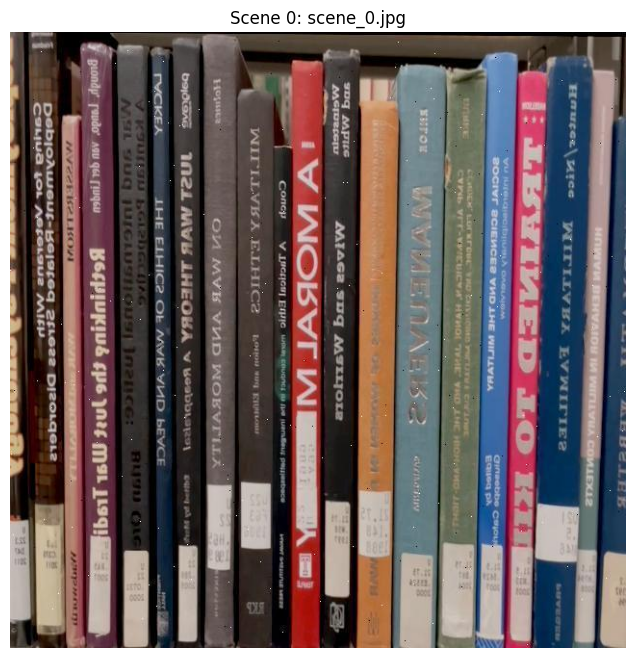

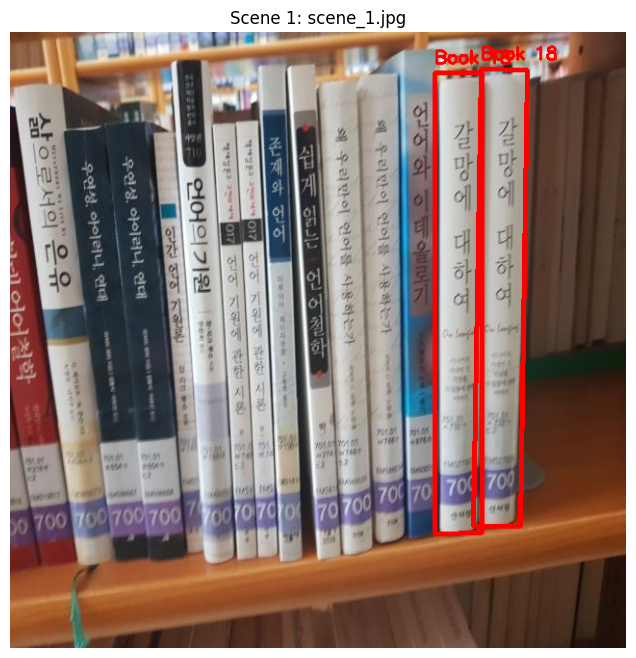

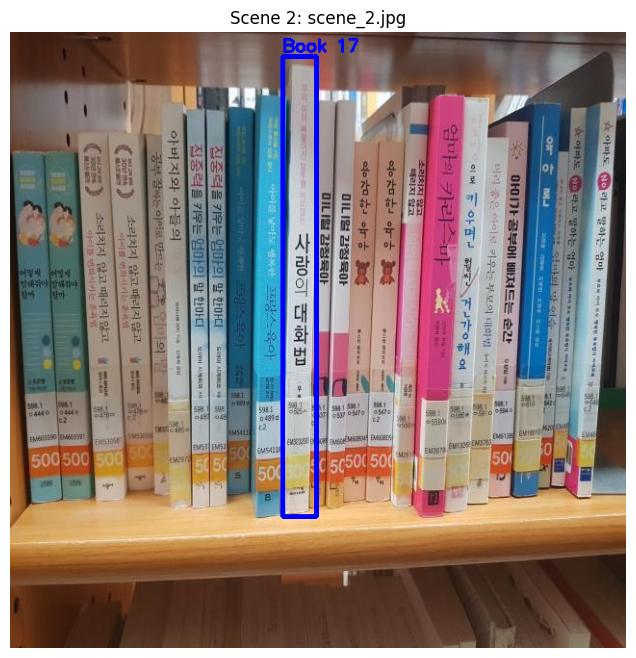

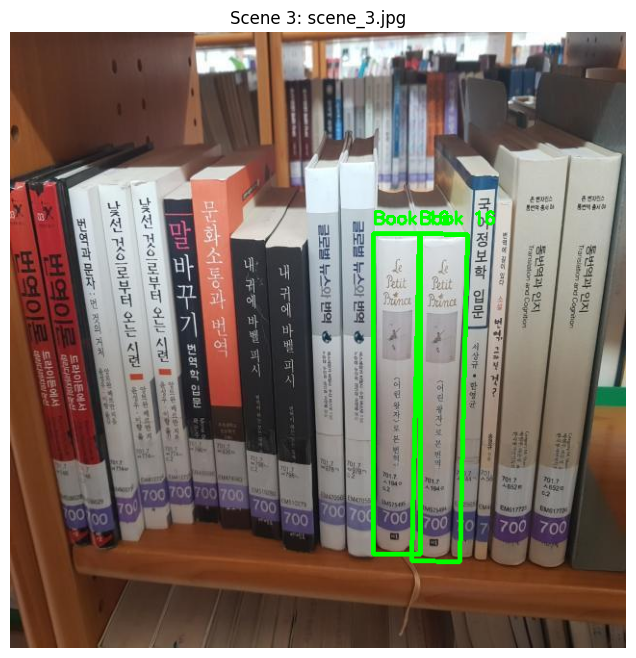

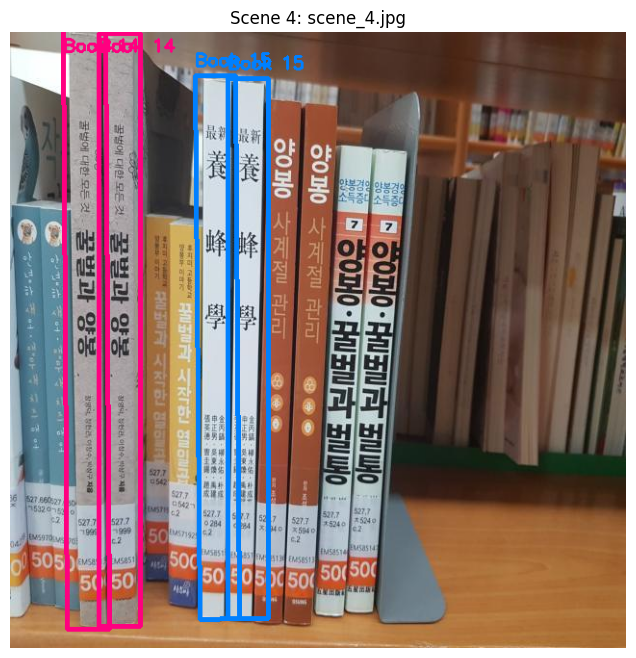

...

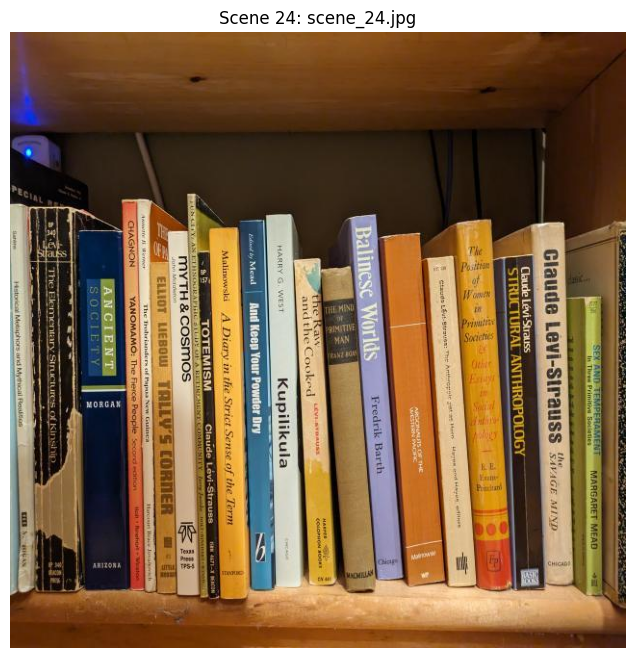

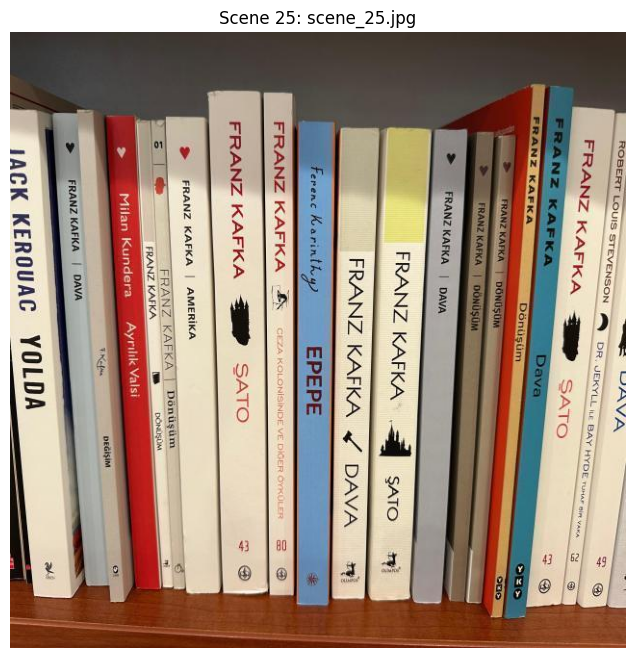

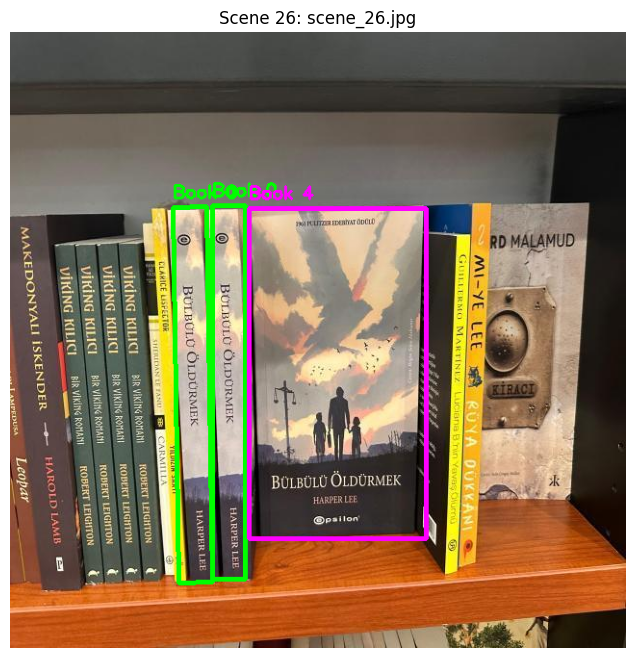

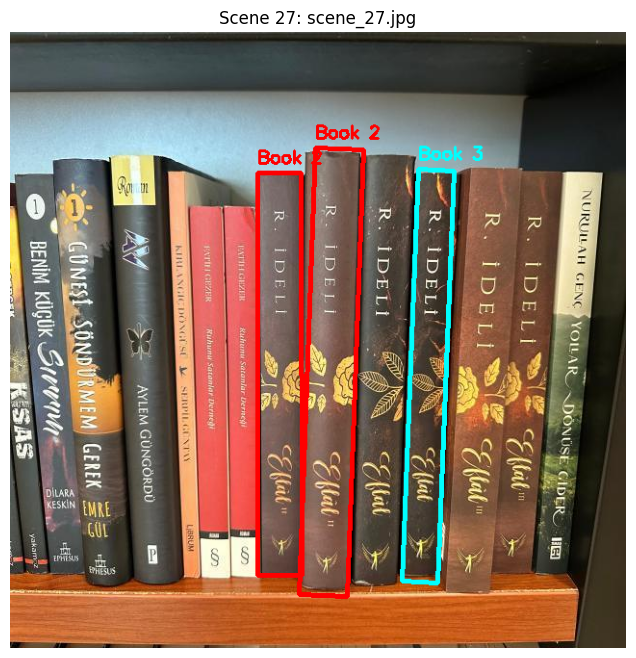

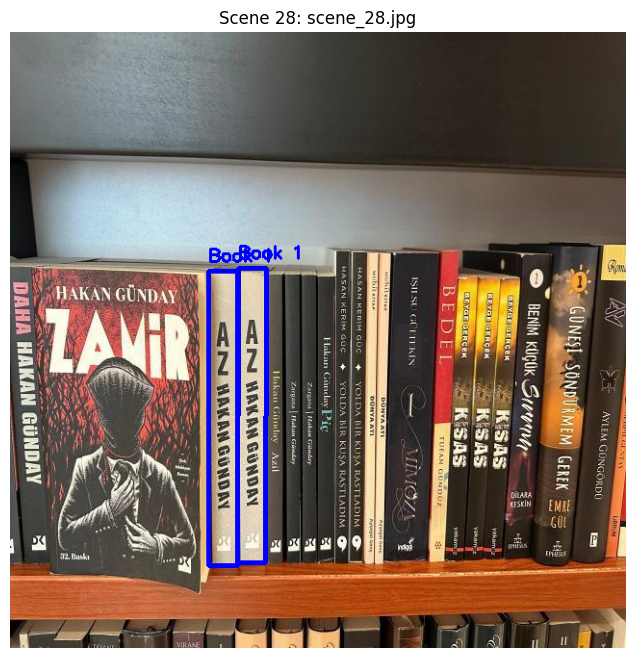

In [15]:
# Visualize all results
for idx in range(len(scene_paths)):
    if idx not in all_images:
        continue

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(all_images[idx], cv2.COLOR_BGR2RGB))
    plt.title(f"Scene {idx}: {Path(scene_paths[idx]).name}")
    plt.axis('off')
    plt.show()

## Analysis

In [16]:
def diagnose_scene(detector, scene_path, model_paths, scene_idx,
                   target_books=None, verbose_matches=False):
    """
    Diagnostic function that mirrors _detect_instances exactly,
    printing every metric at each step including same-book IoU rejection.

    Args:
        detector: BookDetector instance
        scene_path: Path to the scene image
        model_paths: List of all model image paths
        scene_idx: Scene index (for display)
        target_books: Optional list of book IDs to analyze (None = all detected)
        verbose_matches: If True, print individual match distances
    """
    scene_img = cv2.imread(scene_path)
    scene_gray = detector.preprocessor.preprocess(scene_img)
    scene_kp, scene_des = detector.feature_extractor.detect_and_compute(scene_gray)

    print(f"{'='*70}")
    print(f"DIAGNOSTIC: Scene {scene_idx} — {Path(scene_path).name}")
    print(f"{'='*70}")
    print(f"Scene shape: {scene_img.shape}")
    print(f"Scene keypoints: {len(scene_kp)}")
    print(f"Scene descriptors shape: {scene_des.shape}")
    print()

    scene_summary = {}  # book_id -> list of accepted/rejected dicts

    for book_id, model_path in enumerate(model_paths):
        model_img, model_kp, model_des = detector.load_model(model_path)

        if model_des is None or len(model_kp) < Config.MIN_MATCH_COUNT:
            continue

        # Quick pre-check: how many matches total?
        all_matches = detector.matcher.match(model_des, scene_des, excluded_indices=None)

        # Skip books with no interest
        if target_books is not None and book_id not in target_books:
            if len(all_matches) < Config.MIN_MATCH_COUNT:
                continue
        elif target_books is None and len(all_matches) < Config.MIN_MATCH_COUNT:
            continue

        has_interest = (target_books is None and len(all_matches) >= Config.MIN_MATCH_COUNT) or                        (target_books is not None and book_id in target_books)
        if not has_interest:
            continue

        print(f"{'—'*70}")
        print(f"BOOK {book_id}: {Path(model_path).name}")
        print(f"{'—'*70}")
        print(f"  Model shape: {model_img.shape}")
        print(f"  Model keypoints: {len(model_kp)}")
        print(f"  Total matches (no exclusion): {len(all_matches)}")

        if verbose_matches and len(all_matches) > 0:
            dists = sorted([m.distance for m in all_matches])
            print(f"  Match distances — min: {dists[0]:.3f}, median: {dists[len(dists)//2]:.3f}, max: {dists[-1]:.3f}")

        # --- Iterative detection mirroring _detect_instances exactly ---
        excluded_indices = set()
        accepted_instances = []  # list of BoundingBox (for same-book IoU check)
        iteration = 0
        book_log = []

        while iteration < Config.MAX_INSTANCES_PER_BOOK:
            print(f">>> Iteration {iteration}")
            print(f"      Excluded keypoints so far: {len(excluded_indices)}")

            matches = detector.matcher.match(model_des, scene_des, excluded_indices)
            print(f"      Matches after exclusion: {len(matches)}")

            if len(matches) < Config.MIN_MATCH_COUNT:
                print(f"      STOP: Not enough matches ({len(matches)} < {Config.MIN_MATCH_COUNT})")
                break

            src_pts = np.float32([model_kp[m.queryIdx].pt for m in matches])
            dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in matches])
            match_indices = [m.trainIdx for m in matches]

            centroid = np.mean(dst_pts, axis=0)
            print(f"      Match centroid in scene: ({centroid[0]:.0f}, {centroid[1]:.0f})")

            # RANSAC
            H, inlier_mask, n_inliers = detector.affine_estimator.estimate(src_pts, dst_pts)

            if H is None:
                print(f"      STOP: RANSAC failed (H is None)")
                break

            inlier_ratio = n_inliers / len(matches)
            print(f"      RANSAC inliers: {n_inliers} / {len(matches)} = {inlier_ratio:.2%}")

            # Transform params
            scale = np.sqrt(H[0, 0]**2 + H[1, 0]**2)
            rotation_deg = np.arctan2(H[1, 0], H[0, 0]) * 180 / np.pi
            tx, ty = H[0, 2], H[1, 2]
            print(f"      Transform — scale: {scale:.3f}, rotation: {rotation_deg:.1f}°, translation: ({tx:.0f}, {ty:.0f})")

            # Inlier count check
            if n_inliers < Config.MIN_INLIERS:
                print(f"      STOP: Too few inliers ({n_inliers} < {Config.MIN_INLIERS})")
                break
            if inlier_ratio < Config.MIN_INLIERS_RATIO:
                print(f"      STOP: Inlier ratio too low ({inlier_ratio:.2%} < {Config.MIN_INLIERS_RATIO:.2%})")
                break

            # Project corners
            projected = detector.affine_estimator.transform_corners(H, model_img.shape[:2])

            # Validation metrics
            rect = np.int32(projected).reshape(-1, 1, 2)
            contour_area = cv2.contourArea(rect)
            x, y, w, h = cv2.boundingRect(rect)
            bb_area = w * h
            extent = contour_area / bb_area if bb_area > 0 else 0

            print(f"      Contour area: {contour_area:.0f}px")
            print(f"      Bounding rect: ({x},{y}) {w}x{h} = {bb_area}px")
            print(f"      Extent (contour/bbox): {extent:.3f}")

            is_valid, reason = is_rectangle_valid(projected, scene_img.shape)
            print(f"      Validation: {'✓ PASS' if is_valid else '✗ FAIL'} — {reason}")

            if not is_valid:
                print(f"      STOP: Invalid rectangle")
                break

            # Combined extent + inlier check
            rect_check = np.int32(projected).reshape(-1, 1, 2)
            contour_area_chk = cv2.contourArea(rect_check)
            x_r, y_r, w_r, h_r = cv2.boundingRect(rect_check)
            bb_area_chk = w_r * h_r
            extent_chk = contour_area_chk / bb_area_chk if bb_area_chk > 0 else 0
            if extent_chk < Config.LOW_EXTENT_THRESHOLD:
                print(f"      Low extent ({extent_chk:.3f} < {Config.LOW_EXTENT_THRESHOLD}) — checking inlier support: {n_inliers} inliers (need >= {Config.MIN_INLIERS_LOW_EXTENT})")
                if n_inliers < Config.MIN_INLIERS_LOW_EXTENT:
                    print(f"      STOP: Low extent with insufficient inliers")
                    break
                else:
                    print(f"      Low extent accepted: strong inlier support")

            # Build bbox for IoU check
            poly_area = GeometryUtils.polygon_area(projected)
            bbox = BoundingBox(
                top_left=tuple(map(int, projected[0])),
                top_right=tuple(map(int, projected[1])),
                bottom_right=tuple(map(int, projected[2])),
                bottom_left=tuple(map(int, projected[3])),
                area=int(poly_area),
                n_inliers=n_inliers,
                inlier_ratio=inlier_ratio
            )

            # === Same-book IoU overlap check ===
            new_poly = bbox.get_polygon()
            max_iou = 0.0
            max_iou_iter = -1
            for prev_idx, prev_bbox in enumerate(accepted_instances):
                iou = GeometryUtils.polygon_iou(new_poly, prev_bbox.get_polygon())
                if iou > max_iou:
                    max_iou = iou
                    max_iou_iter = prev_idx

            if len(accepted_instances) > 0:
                print(f"      Same-book IoU: max {max_iou:.3f} (vs instance {max_iou_iter}), threshold: {Config.SAME_BOOK_IOU_THRESHOLD}")

            is_same_book_dup = max_iou > Config.SAME_BOOK_IOU_THRESHOLD

            if is_same_book_dup:
                print(f"      ✗ REJECTED: Same-book overlap IoU {max_iou:.3f} > {Config.SAME_BOOK_IOU_THRESHOLD}")
                book_log.append({'iteration': iteration, 'status': 'REJECTED_OVERLAP',
                                 'iou': max_iou, 'n_inliers': n_inliers})
                # Spatial inlier exclusion (mirrors pipeline)
                polygon = projected.astype(np.float32).reshape(-1, 1, 2)
                for i in range(len(match_indices)):
                    if inlier_mask[i]:
                        kp_idx = match_indices[i]
                        pt = scene_kp[kp_idx].pt
                        if cv2.pointPolygonTest(polygon, pt, measureDist=True) >= 0:
                            excluded_indices.add(kp_idx)
                iteration += 1
                continue

            # Accepted
            print(f"      ✓ ACCEPTED (area={poly_area:.0f}px, {n_inliers} inliers)")
            accepted_instances.append(bbox)
            book_log.append({'iteration': iteration, 'status': 'ACCEPTED',
                             'area': poly_area, 'n_inliers': n_inliers, 'inlier_ratio': inlier_ratio})

            # Spatial inlier exclusion (mirrors pipeline)
            polygon = projected.astype(np.float32).reshape(-1, 1, 2)
            for i in range(len(match_indices)):
                if inlier_mask[i]:
                    kp_idx = match_indices[i]
                    pt = scene_kp[kp_idx].pt
                    if cv2.pointPolygonTest(polygon, pt, measureDist=True) >= 0:
                        excluded_indices.add(kp_idx)

            iteration += 1

        # Book summary
        n_accepted = len(accepted_instances)
        n_rejected = sum(1 for l in book_log if l['status'] == 'REJECTED_OVERLAP')
        print(f"SUMMARY Book {book_id}: {n_accepted} accepted, {n_rejected} rejected (overlap), {iteration} iterations")
        scene_summary[book_id] = book_log
        print()

    # Final scene summary
    print(f"{'='*70}")
    print(f"SCENE {scene_idx} SUMMARY")
    print(f"{'='*70}")
    total_accepted = sum(len([l for l in logs if l['status'] == 'ACCEPTED']) for logs in scene_summary.values())
    total_rejected = sum(len([l for l in logs if l['status'] == 'REJECTED_OVERLAP']) for logs in scene_summary.values())
    print(f"Total accepted detections: {total_accepted}")
    print(f"Total rejected (same-book overlap): {total_rejected}")
    for bid, logs in scene_summary.items():
        accepted = [l for l in logs if l['status'] == 'ACCEPTED']
        rejected = [l for l in logs if l['status'] == 'REJECTED_OVERLAP']
        if accepted or rejected:
            print(f"  Book {bid}: {len(accepted)} accepted, {len(rejected)} rejected")

    return scene_summary


In [17]:
diagnose_scene(detector, scene_paths[16], model_paths, scene_idx=16, target_books=[12])

DIAGNOSTIC: Scene 16 — scene_16.jpg
Scene shape: (640, 640, 3)
Scene keypoints: 10275
Scene descriptors shape: (10275, 128)

——————————————————————————————————————————————————————————————————————
BOOK 12: model_12.png
——————————————————————————————————————————————————————————————————————
  Model shape: (603, 57, 3)
  Model keypoints: 631
  Total matches (no exclusion): 74
>>> Iteration 0
      Excluded keypoints so far: 0
      Matches after exclusion: 74
      Match centroid in scene: (515, 319)
      RANSAC inliers: 48 / 74 = 64.86%
      Transform — scale: 0.519, rotation: 1.0°, translation: (500, 215)
      Contour area: 9239px
      Bounding rect: (494,214) 36x315 = 11340px
      Extent (contour/bbox): 0.815
      Validation: ✓ PASS — Valid rectangle
      ✓ ACCEPTED (area=9259px, 48 inliers)
>>> Iteration 1
      Excluded keypoints so far: 47
      Matches after exclusion: 26
      Match centroid in scene: (520, 280)
      RANSAC inliers: 16 / 26 = 61.54%
      Transform — scale:

{12: [{'iteration': 0,
   'status': 'ACCEPTED',
   'area': np.float32(9258.891),
   'n_inliers': 48,
   'inlier_ratio': 0.6486486486486487},
  {'iteration': 1,
   'status': 'ACCEPTED',
   'area': np.float32(9059.359),
   'n_inliers': 16,
   'inlier_ratio': 0.6153846153846154},
  {'iteration': 2,
   'status': 'ACCEPTED',
   'area': np.float32(9417.125),
   'n_inliers': 10,
   'inlier_ratio': 1.0}]}

## 16. Statistics

In [18]:
# Compute statistics
total_detections = 0
detections_per_scene = []
detections_per_book = defaultdict(int)

for detections in all_results.values():
    scene_total = sum(len(d.instances) for d in detections)
    detections_per_scene.append(scene_total)
    total_detections += scene_total

    for d in detections:
        if len(d.instances) > 0:
            detections_per_book[d.book_id] += len(d.instances)

print("DETECTION STATISTICS")
print("="*60)
print(f"Total detections: {total_detections}")
print(f"Average per scene: {np.mean(detections_per_scene):.2f}")
print(f"Max in one scene: {max(detections_per_scene)}")
print(f"\nUnique books detected: {len(detections_per_book)}")

print("\nTop 10 most detected books:")
for book_id, count in sorted(detections_per_book.items(), key=lambda x: -x[1])[:10]:
    print(f"  Book {book_id}: {count} instances")

DETECTION STATISTICS
Total detections: 58
Average per scene: 2.00
Max in one scene: 9

Unique books detected: 22

Top 10 most detected books:
  Book 12: 9 instances
  Book 19: 7 instances
  Book 11: 6 instances
  Book 8: 3 instances
  Book 9: 3 instances
  Book 10: 3 instances
  Book 6: 3 instances
  Book 18: 2 instances
  Book 16: 2 instances
  Book 14: 2 instances


## 17. Conclusion

### Summary

This pipeline implements book detection using traditional computer vision:

1. **RootSIFT features** for robust descriptor matching
2. **BF 5NN consecutive ratio test** for feature matching
3. **Similarity transform** (4 DOF via `estimateAffinePartial2D`) for geometric verification
4. **Iterative keypoint exclusion** for multi-instance detection

